In [1]:
!pip install -U -q gdown ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 903.1/903.1 kB 22.3 MB/s eta 0:00:00


In [2]:
import os
import shutil
import gdown
import random
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from collections import Counter
from xml.etree import ElementTree
import cv2
import matplotlib.pyplot as plt
from IPython.display import Image, Video
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
raw_data_path = 'raw_data'

In [4]:
if os.path.exists(raw_data_path):
    print('[INFO] Raw data directory exists, skiping download.')
else:
    os.makedirs(raw_data_path)
    print('[INFO] Raw data directory is been created.')
    print('[INFO] Downloading data...\n')
    gdown.download('https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw', output=os.path.join(raw_data_path, 'Annotations.zip'))
    gdown.download('https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr', output=os.path.join(raw_data_path, 'JPEGImages-test.zip'))
    gdown.download('https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir', output=os.path.join(raw_data_path, 'JPEGImages-trainval.zip'))
    print('[INFO] Data is been downloaded.')

[INFO] Raw data directory is been created.
[INFO] Downloading data...



Downloading...
From (original): https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw
From (redirected): https://drive.google.com/uc?id=1KoQzqR20qvIXDf1qsXCHGxD003IPmXMw&confirm=t&uuid=b3ae15d5-2777-432f-bdf9-83ec8173e78d
To: /content/raw_data/Annotations.zip
100%|██████████| 32.1M/32.1M [00:01<00:00, 25.7MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr
From (redirected): https://drive.google.com/uc?id=11SXPqcESez9qTn4Z5Q3v35K9hRwO_epr&confirm=t&uuid=eaafbe8d-df12-4d9f-af81-fc4bf27a24a6
To: /content/raw_data/JPEGImages-test.zip
100%|██████████| 3.52G/3.52G [00:45<00:00, 78.3MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir
From (redirected): https://drive.google.com/uc?id=1ZHbHDM6hYAEGDC_K5eiW0yF_lzVgpuir&confirm=t&uuid=5521141e-9bd3-46e2-a86e-2fe913152378
To: /content/raw_data/JPEGImages-trainval.zip
100%|██████████| 3.88G/3.88G [00:45<00:00, 85.0MB/s]

[INFO] Data is been downloaded.


In [5]:
dior_data_path = 'dior_data'

In [6]:
# Extracting the zip data files
if os.path.exists(dior_data_path):
    print('[INFO] DIOR data directory exists, skiping extraction.')
else:
    os.makedirs(dior_data_path)
    for i in os.listdir(raw_data_path):
        filename = os.path.join(raw_data_path, i)
        shutil.unpack_archive(filename=filename, extract_dir=dior_data_path)
        print(f'[INFO] File "{filename}" is been extracted to "{dior_data_path}".')

[INFO] File "raw_data/JPEGImages-trainval.zip" is been extracted to "dior_data".
[INFO] File "raw_data/Annotations.zip" is been extracted to "dior_data".
[INFO] File "raw_data/JPEGImages-test.zip" is been extracted to "dior_data".


In [7]:
# Path for all the data
annot_data_path = 'dior_data/Annotations/Horizontal Bounding Boxes'
trainval_data_path = 'dior_data/JPEGImages-trainval'
test_data_path = 'dior_data/JPEGImages-test'

In [8]:
# Creating a list of annotation files
annot_file_list = sorted([os.path.join(annot_data_path, i) for i in os.listdir(annot_data_path) if '.xml' in i])
annot_file_list[:5], annot_file_list[-5:], len(annot_file_list)

(['dior_data/Annotations/Horizontal Bounding Boxes/00001.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00002.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00003.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00004.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/00005.xml'],
 ['dior_data/Annotations/Horizontal Bounding Boxes/23459.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23460.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23461.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23462.xml',
  'dior_data/Annotations/Horizontal Bounding Boxes/23463.xml'],
 23463)

In [9]:
# Creating a list of training and validation images
trainval_file_list = sorted([os.path.join(trainval_data_path, i) for i in os.listdir(trainval_data_path) if '.jpg' in i])
trainval_file_list[:5], trainval_file_list[-5:], len(trainval_file_list)

(['dior_data/JPEGImages-trainval/00001.jpg',
  'dior_data/JPEGImages-trainval/00002.jpg',
  'dior_data/JPEGImages-trainval/00003.jpg',
  'dior_data/JPEGImages-trainval/00004.jpg',
  'dior_data/JPEGImages-trainval/00005.jpg'],
 ['dior_data/JPEGImages-trainval/11721.jpg',
  'dior_data/JPEGImages-trainval/11722.jpg',
  'dior_data/JPEGImages-trainval/11723.jpg',
  'dior_data/JPEGImages-trainval/11724.jpg',
  'dior_data/JPEGImages-trainval/11725.jpg'],
 11725)

In [10]:
# Creating a list of testing images
test_file_list = sorted([os.path.join(test_data_path, i) for i in os.listdir(test_data_path) if '.jpg' in i])
test_file_list[:5], test_file_list[-5:], len(test_file_list)

(['dior_data/JPEGImages-test/11726.jpg',
  'dior_data/JPEGImages-test/11727.jpg',
  'dior_data/JPEGImages-test/11728.jpg',
  'dior_data/JPEGImages-test/11729.jpg',
  'dior_data/JPEGImages-test/11730.jpg'],
 ['dior_data/JPEGImages-test/23459.jpg',
  'dior_data/JPEGImages-test/23460.jpg',
  'dior_data/JPEGImages-test/23461.jpg',
  'dior_data/JPEGImages-test/23462.jpg',
  'dior_data/JPEGImages-test/23463.jpg'],
 11738)

In [11]:
# Combining all the images path in one list
image_data_file_list = np.concatenate((trainval_file_list, test_file_list))
image_data_file_list[:5], image_data_file_list[-5:], len(image_data_file_list)

(array(['dior_data/JPEGImages-trainval/00001.jpg', 'dior_data/JPEGImages-trainval/00002.jpg', 'dior_data/JPEGImages-trainval/00003.jpg', 'dior_data/JPEGImages-trainval/00004.jpg', 'dior_data/JPEGImages-trainval/00005.jpg'], dtype='<U39'),
 array(['dior_data/JPEGImages-test/23459.jpg', 'dior_data/JPEGImages-test/23460.jpg', 'dior_data/JPEGImages-test/23461.jpg', 'dior_data/JPEGImages-test/23462.jpg', 'dior_data/JPEGImages-test/23463.jpg'], dtype='<U39'),
 23463)

In [12]:
# Extracting data from annotation files
meta_list = [] # To store general info for every image
object_list_train = [] # To store object classes info of train dataset
object_list_test = [] # To store object classes info of test dataset

for file in tqdm(annot_file_list):
    meta_dict = {}
    root = ElementTree.parse(file).getroot()

    # Filename - extracted
    for path in image_data_file_list:
        if root.find('filename').text in path:
            meta_dict['filename'] = path
            meta_dict['split_type'] = path.split('/')[1]

    # Width - extracted
    meta_dict['width'] = int(root.find('size').find('width').text)

    # Height - extracted
    meta_dict['height'] = int(root.find('size').find('height').text)

    # Objects - extracted and combined into a single string
    meta_dict['objects'] = ', '.join(np.unique([obj.find('name').text for obj in root.findall('object')]))
    meta_list.append(meta_dict)

    # Collecting all the object classes instance and counting total appearance
    for obj in root.findall('object'):
        if meta_dict['split_type'] == 'JPEGImages-trainval':
            object_list_train.append(obj.find('name').text)
        elif meta_dict['split_type'] == 'JPEGImages-test':
            object_list_test.append(obj.find('name').text)

# Counting the instance for every object class
object_instance_list_train = Counter(sorted(object_list_train))
object_instance_list_test = Counter(sorted(object_list_test))

# Collecting Class list and indexing it also in a sequence
class_dict = {k: v for v, k in enumerate(sorted(np.unique(object_list_train)))}

meta_list[:5], object_instance_list_train, object_instance_list_test, class_dict

  0%|          | 0/23463 [00:00<?, ?it/s]

([{'filename': 'dior_data/JPEGImages-trainval/00001.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'golffield'},
  {'filename': 'dior_data/JPEGImages-trainval/00002.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'Expressway-toll-station, vehicle'},
  {'filename': 'dior_data/JPEGImages-trainval/00003.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'trainstation'},
  {'filename': 'dior_data/JPEGImages-trainval/00004.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'chimney'},
  {'filename': 'dior_data/JPEGImages-trainval/00005.jpg',
   'split_type': 'JPEGImages-trainval',
   'width': 800,
   'height': 800,
   'objects': 'storagetank, vehicle'}],
 Counter({'Expressway-Service-area': 1080,
          'Expressway-toll-station': 610,
          'airplane': 1888,
          'airport': 662,
          'baseballf

In [13]:
# Creating a dataframe from the extracted data
meta_df = pd.DataFrame(meta_list)
meta_df

,filename,split_type,width,height,objects
0,dior_data/JPEGImages-trainval/00001.jpg,JPEGImages-trainval,800,800,golffield
1,dior_data/JPEGImages-trainval/00002.jpg,JPEGImages-trainval,800,800,"Expressway-toll-station, vehicle"
2,dior_data/JPEGImages-trainval/00003.jpg,JPEGImages-trainval,800,800,trainstation
3,dior_data/JPEGImages-trainval/00004.jpg,JPEGImages-trainval,800,800,chimney
4,dior_data/JPEGImages-trainval/00005.jpg,JPEGImages-trainval,800,800,"storagetank, vehicle"
...,...,...,...,...,...
23458,dior_data/JPEGImages-test/23459.jpg,JPEGImages-test,800,800,vehicle
23459,dior_data/JPEGImages-test/23460.jpg,JPEGImages-test,800,800,"groundtrackfield, tenniscourt, vehicle"
23460,dior_data/JPEGImages-test/23461.jpg,JPEGImages-test,800,800,"overpass, vehicle"
23461,dior_data/JPEGImages-test/23462.jpg,JPEGImages-test,800,800,"overpass, vehicle"


In [14]:
print(f'Size of the images width: {meta_df.width.unique()[0]} and height: {meta_df.height.unique()[0]}')
print(f'Total number of classes with all possible combination: {len(meta_df.objects.unique())}')
print(f'Total length of the training/validation dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-trainval"])} and testing dataset: {len(meta_df[meta_df["split_type"] == "JPEGImages-test"])}')

Size of the images width: 800 and height: 800
Total number of classes with all possible combination: 526
Total length of the training/validation dataset: 11725 and testing dataset: 11738


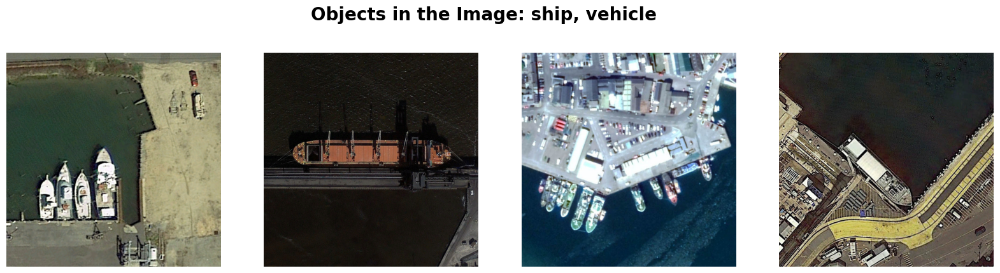

In [15]:
# Visualizing the classes - rerun the code for different classes.
viz_class = random.sample(meta_df.objects.tolist(), 1)[0]
viz_list = meta_df[meta_df['objects'] == viz_class].filename.tolist()
plt.figure(figsize=(20, 5))
rand = random.sample(viz_list, 4)
for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.imshow(plt.imread(rand[i]))
    plt.suptitle(f'Objects in the Image: {viz_class}', fontsize=20, fontweight='bold')
    plt.axis(False)

In [16]:
# Creating a function for extracting data
def extract_data_from_xml(xml_file: str):
    """
    A function to extract data like filename, size, classes and bboxes from xml file.

    Parameters: xml_file: str, A string containing the path to the file.

    Returns: data_dict: dict, A dict containing all the extracted data.
    """
    root = ElementTree.parse(xml_file).getroot()

    # Creating dict and list to store data
    data_dict = {}
    data_dict['bboxes'] = []

    # Reading the xml file
    for element in root:
        # Getting the filename
        if element.tag == 'filename':
            data_dict['filename'] = element.text

        # Getting the image size
        elif element.tag == 'size':
            image_size = []
            for size_element in element:
                image_size.append(int(size_element.text))
            data_dict['image_size'] = image_size

        # Getting the bounding box
        elif element.tag == 'object':
            bbox = {}
            for obj_element in element:
                # Object or Class name
                if obj_element.tag == 'name':
                    bbox['class'] = obj_element.text
                # Object bounding box
                elif obj_element.tag == 'bndbox':
                    for bbox_element in obj_element:
                        bbox[bbox_element.tag] = int(bbox_element.text)
            data_dict['bboxes'].append(bbox)
    return data_dict

In [17]:
example = extract_data_from_xml(annot_file_list[1])
example

{'bboxes': [{'class': 'Expressway-toll-station',
   'xmin': 231,
   'ymin': 221,
   'xmax': 303,
   'ymax': 304},
  {'class': 'vehicle', 'xmin': 49, 'ymin': 231, 'xmax': 67, 'ymax': 242},
  {'class': 'vehicle', 'xmin': 54, 'ymin': 252, 'xmax': 72, 'ymax': 262},
  {'class': 'vehicle', 'xmin': 297, 'ymin': 227, 'xmax': 316, 'ymax': 239}],
 'filename': '00002.jpg',
 'image_size': [800, 800, 3]}

In [18]:
# Creating a function to create a YOLO format annotation
def convert_dict_to_yolo(data_dict: dict):
    """
    A function to convert the extracted data dict into a text file as per the YOLO format.
    The final text file is saved in the directory "dior_data/yolo_annotations/data_dict['filename'].txt".

    Parameters: data_dict: dict, A dict containing the data.
    """
    data = []

    # Reading the bounding box data
    for bbox in data_dict['bboxes']:
        try:
            class_id = class_dict[bbox['class']]
        except KeyError:
            print(f'Invalid Class. Object class: "{bbox["class"]}" not present in the class list.')

        # Transforming the bbox in Yolo format [X, Y, W, H]
        img_w, img_h, _ = data_dict['image_size'] # Normalizing the bbox using image size

        x_center = ((bbox['xmin'] + bbox['xmax']) / 2) / img_w
        y_center = ((bbox['ymin'] + bbox['ymax']) / 2) / img_h
        width = (bbox['xmax'] - bbox['xmin']) / img_w
        height = (bbox['ymax'] - bbox['ymin']) / img_h

        # Writing the new data to the data list in Yolo format
        data.append(f'{class_id} {x_center:.3f} {y_center:.3f} {width:.3f} {height:.3f}')

    # File name for saving the text file(same as xml and jpg file name)
    yolo_annot_dir = os.path.join('dior_data', 'yolo_annotations')
    if not os.path.exists(yolo_annot_dir):
        os.makedirs(yolo_annot_dir)
    save_file_name = os.path.join(yolo_annot_dir, data_dict['filename'].replace('jpg', 'txt'))

    # Saving the yolo annotation in a text file
    f = open(save_file_name, 'w+')
    f.write('\n'.join(data))
    f.close()


In [19]:
# Converting all the xml files into Yolo format text files
print('[INFO] Annotation extraction and creation into Yolo has started.')
for annot_file in tqdm(annot_file_list):
    data_dict = extract_data_from_xml(annot_file)
    convert_dict_to_yolo(data_dict)
print('[INFO] All the annotation are converted into Yolo format.')

[INFO] Annotation extraction and creation into Yolo has started.


  0%|          | 0/23463 [00:00<?, ?it/s]

[INFO] All the annotation are converted into Yolo format.


In [20]:
yolo_annot_path = 'dior_data/yolo_annotations'
yolo_annot_file_list = sorted([os.path.join(yolo_annot_path, i) for i in os.listdir(yolo_annot_path) if '.txt' in i])
yolo_annot_file_list[:5], yolo_annot_file_list[-5:], len(yolo_annot_file_list)

(['dior_data/yolo_annotations/00001.txt',
  'dior_data/yolo_annotations/00002.txt',
  'dior_data/yolo_annotations/00003.txt',
  'dior_data/yolo_annotations/00004.txt',
  'dior_data/yolo_annotations/00005.txt'],
 ['dior_data/yolo_annotations/23459.txt',
  'dior_data/yolo_annotations/23460.txt',
  'dior_data/yolo_annotations/23461.txt',
  'dior_data/yolo_annotations/23462.txt',
  'dior_data/yolo_annotations/23463.txt'],
 23463)

In [21]:
class_dict_idx = dict(zip(class_dict.values(), class_dict.keys()))
class_dict_idx

{0: 'Expressway-Service-area',
 1: 'Expressway-toll-station',
 2: 'airplane',
 3: 'airport',
 4: 'baseballfield',
 5: 'basketballcourt',
 6: 'bridge',
 7: 'chimney',
 8: 'dam',
 9: 'golffield',
 10: 'groundtrackfield',
 11: 'harbor',
 12: 'overpass',
 13: 'ship',
 14: 'stadium',
 15: 'storagetank',
 16: 'tenniscourt',
 17: 'trainstation',
 18: 'vehicle',
 19: 'windmill'}

In [22]:
def plot_bboxes(img_file: str, annot_file: str, class_dict: dict):
    """
    A function to plot the bounding boxes amd their object classes onto the image.

    Parameters:
        img_file: str, A string containing the path to the image file.
        annot_file: str, A string containing the path to the annotation file in yolo format.
        class_dict: dict, A dict containing the classes in the similar sequence as per the annot_file.
    """
    # Reading the image and annot file
    image = cv2.imread(img_file)
    img_h, img_w, _ = image.shape

    with open(annot_file, 'r') as f:
        data = f.read().split('\n')
        data = [i.split(' ') for i in data]
        data = [[float(j) for j in i] for i in data]

    # Calculating the bbox in Pascal VOC format
    for bbox in data:
        class_idx, x_center, y_center, width, height = bbox
        xmin = int((x_center - width / 2) * img_w)
        ymin = int((y_center - height / 2) * img_h)
        xmax = int((x_center + width / 2) * img_w)
        ymax = int((y_center + height / 2) * img_h)

        # Correcting bbox if out of image size
        if xmin < 0:
            xmin = 0
        if ymin < 0:
            ymin = 0
        if xmax > img_w - 1:
            xmax = img_w - 1
        if ymax > img_h - 1:
            ymax = img_h - 1

        # Creating the box and label for the image
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 255, 0), 2)
        cv2.putText(image, class_dict[class_idx], (xmin, 0 if ymin-10 < 0 else ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 255, 0), 2)

    # Displaying the image
    plt.imshow(image)
    plt.axis(False)

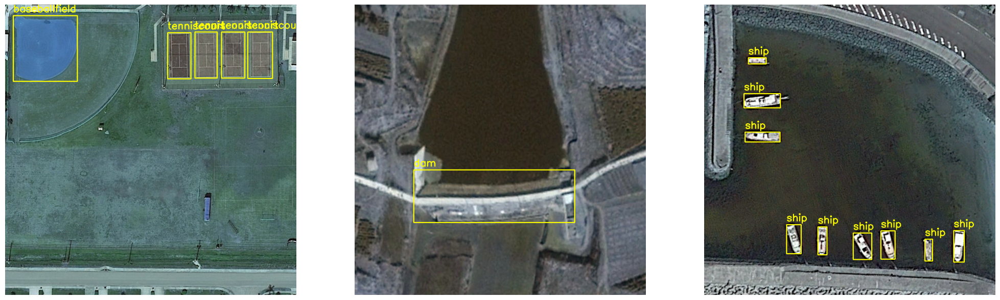

In [23]:
plt.figure(figsize=(25, 8))
rand_int = random.sample(range(len(yolo_annot_file_list)), 3)
for i in range(3):
    plt.subplot(1, 3, i+1)
    plot_bboxes(image_data_file_list[rand_int[i]], yolo_annot_file_list[rand_int[i]], class_dict_idx)

TRAIN


In [24]:
# Creating images and labels directory into the data directory
root_dir = 'datasets'
image_dir = 'datasets/images'
label_dir = 'datasets/labels'
img_train_dir = 'datasets/images/train'
img_val_dir = 'datasets/images/val'
label_train_dir = 'datasets/labels/train'
label_val_dir = 'datasets/labels/val'

# Using 20% of the test dataset for validation
total_val_size = int(len(test_file_list) * 0.2)
total_val_size

2347

In [25]:
# Moving the training images
if not os.path.exists(img_train_dir):
    os.makedirs(img_train_dir)

for filepath in tqdm(trainval_file_list):
    if os.path.isfile(filepath):
        shutil.move(filepath, img_train_dir)

  0%|          | 0/11725 [00:00<?, ?it/s]

In [26]:
# Moving the Validation images[20% of test dataset]
if not os.path.exists(img_val_dir):
    os.makedirs(img_val_dir)

for filepath in tqdm(test_file_list[:total_val_size]):
    if os.path.isfile(filepath):
        shutil.move(filepath, img_val_dir)

  0%|          | 0/2347 [00:00<?, ?it/s]

In [27]:
# Moving the training labels
if not os.path.exists(label_train_dir):
    os.makedirs(label_train_dir)

for filepath in tqdm(trainval_file_list):
    file_path = os.path.join('dior_data/yolo_annotations', filepath.replace('jpg', 'txt').split('/')[-1])
    if os.path.isfile(file_path):
        shutil.move(file_path, label_train_dir)

  0%|          | 0/11725 [00:00<?, ?it/s]

In [28]:
# Moving the validation labels[20% of test dataset]
if not os.path.exists(label_val_dir):
    os.makedirs(label_val_dir)

for filepath in tqdm(test_file_list[:total_val_size]):
    file_path = os.path.join('dior_data/yolo_annotations', filepath.replace('jpg', 'txt').split('/')[-1])
    if os.path.isfile(file_path):
        shutil.move(file_path, label_val_dir)

  0%|          | 0/2347 [00:00<?, ?it/s]

In [29]:
%%writefile config.yaml
# Path to my dataset
path:
train: 'images/train'
val: 'images/val'

# Classes as per mentioned in the annotation
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill

Writing config.yaml


In [30]:
# Loading the model
model = YOLO('yolov5n.yaml') # Builds the model from scratch


In [31]:
# Training the model for 1 epoch
results = model.train(data='config.yaml', imgsz=800, epochs=25, batch=25)

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov5n.yaml, data=config.yaml, epochs=25, time=None, patience=100, batch=25, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_w

100%|██████████| 755k/755k [00:00<00:00, 21.0MB/s]


Overriding model.yaml nc=80 with nc=20

                   from  n    params  module                                       arguments                     
  0                  -1  1      1760  ultralytics.nn.modules.conv.Conv             [3, 16, 6, 2, 2]              
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      4800  ultralytics.nn.modules.block.C3              [32, 32, 1]                   
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     29184  ultralytics.nn.modules.block.C3              [64, 64, 2]                   
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  3    156928  ultralytics.nn.modules.block.C3              [128, 128, 3]                 
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 90.2MB/s]


AMP: checks passed ✅


train: Scanning /content/datasets/labels/train... 11725 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11725/11725 [00:31<00:00, 367.22it/s]

train: WARNING ⚠️ /content/datasets/images/train/00594.jpg: 1 duplicate labels removed


train: New cache created: /content/datasets/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.24 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/datasets/labels/val... 2347 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2347/2347 [00:08<00:00, 282.43it/s]

val: New cache created: /content/datasets/labels/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000417, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005859375000000001), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 800 train, 800 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      11.7G      3.405      5.161      3.934        213        800: 100%|██████████| 469/469 [07:27<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:51<00:00,  1.09s/it]


                   all       2347      25815      0.549     0.0246    0.00802    0.00278

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      11.8G      2.741      3.939      2.873        211        800: 100%|██████████| 469/469 [07:28<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:49<00:00,  1.06s/it]


                   all       2347      25815      0.598     0.0918     0.0706     0.0318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      11.3G      2.217      2.965      2.195        233        800: 100%|██████████| 469/469 [07:30<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:48<00:00,  1.04s/it]


                   all       2347      25815      0.635      0.126      0.145     0.0786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      14.8G      1.959      2.407      1.901        438        800: 100%|██████████| 469/469 [07:21<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:47<00:00,  1.01s/it]


                   all       2347      25815      0.454      0.209        0.2      0.114

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      11.8G      1.843      2.159      1.773        161        800: 100%|██████████| 469/469 [07:15<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:50<00:00,  1.08s/it]


                   all       2347      25815      0.406      0.241      0.228       0.13

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      10.1G      1.747      1.935      1.665        419        800: 100%|██████████| 469/469 [07:17<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:49<00:00,  1.06s/it]


                   all       2347      25815      0.495      0.282      0.267      0.158

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25      13.9G      1.678      1.808      1.608        194        800: 100%|██████████| 469/469 [07:19<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:49<00:00,  1.06s/it]


                   all       2347      25815      0.434      0.305      0.296      0.174

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      13.6G      1.627      1.698      1.556        165        800: 100%|██████████| 469/469 [07:08<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:50<00:00,  1.07s/it]


                   all       2347      25815      0.476      0.315      0.316      0.188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25        10G      1.591      1.611      1.514        186        800: 100%|██████████| 469/469 [07:03<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:49<00:00,  1.06s/it]


                   all       2347      25815      0.542      0.353      0.352       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25        12G      1.552      1.555       1.49        114        800: 100%|██████████| 469/469 [06:59<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:45<00:00,  1.03it/s]


                   all       2347      25815      0.515       0.37       0.37      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      12.9G      1.512       1.48      1.455        371        800: 100%|██████████| 469/469 [06:44<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:46<00:00,  1.01it/s]


                   all       2347      25815      0.498      0.368      0.367      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      13.8G       1.49      1.432      1.428        240        800: 100%|██████████| 469/469 [06:44<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:44<00:00,  1.07it/s]


                   all       2347      25815      0.526       0.38      0.401      0.245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      11.5G      1.467      1.392      1.412        288        800: 100%|██████████| 469/469 [06:43<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:44<00:00,  1.05it/s]


                   all       2347      25815      0.595      0.406       0.42      0.251

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      8.81G      1.451      1.355      1.394        116        800: 100%|██████████| 469/469 [06:44<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:45<00:00,  1.03it/s]


                   all       2347      25815      0.559      0.402      0.425      0.256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25      10.5G      1.433      1.319      1.378        187        800: 100%|██████████| 469/469 [06:46<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:44<00:00,  1.06it/s]


                   all       2347      25815      0.568       0.42      0.446      0.275
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      10.8G      1.359      1.202      1.372         84        800: 100%|██████████| 469/469 [06:44<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:47<00:00,  1.01s/it]


                   all       2347      25815      0.569      0.446      0.467      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      11.2G      1.336      1.156      1.357        212        800: 100%|██████████| 469/469 [06:40<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:46<00:00,  1.02it/s]


                   all       2347      25815      0.626      0.448      0.475      0.289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25      13.6G      1.313      1.116      1.337        441        800: 100%|██████████| 469/469 [06:37<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:44<00:00,  1.05it/s]


                   all       2347      25815      0.611      0.464      0.489      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      11.2G      1.306      1.098      1.329        148        800: 100%|██████████| 469/469 [06:32<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:43<00:00,  1.08it/s]


                   all       2347      25815      0.605      0.476      0.496      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      10.6G      1.289      1.074      1.318        108        800: 100%|██████████| 469/469 [06:34<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:43<00:00,  1.09it/s]


                   all       2347      25815      0.647      0.474      0.508      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      13.8G      1.278      1.052      1.308        107        800: 100%|██████████| 469/469 [06:33<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:43<00:00,  1.09it/s]


                   all       2347      25815      0.654      0.467      0.513      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      11.9G      1.264      1.038      1.297        286        800: 100%|██████████| 469/469 [06:31<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:43<00:00,  1.08it/s]


                   all       2347      25815      0.652      0.494      0.521      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      12.2G      1.258      1.025      1.292        121        800: 100%|██████████| 469/469 [06:32<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:42<00:00,  1.10it/s]


                   all       2347      25815      0.666       0.49      0.526      0.329

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      10.7G      1.242      1.008      1.284        180        800: 100%|██████████| 469/469 [06:35<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:44<00:00,  1.05it/s]


                   all       2347      25815      0.681      0.489       0.53      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      12.5G      1.235      1.002      1.281        265        800: 100%|██████████| 469/469 [06:30<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:45<00:00,  1.04it/s]


                   all       2347      25815      0.665      0.498      0.534      0.334

25 epochs completed in 3.216 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.3MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.3MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5n summary (fused): 193 layers, 2,506,844 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [00:50<00:00,  1.08s/it]


                   all       2347      25815      0.664      0.499      0.534      0.334
Expressway-Service-area        118        225      0.623       0.48      0.496      0.294
Expressway-toll-station        118        127      0.666      0.331      0.369      0.274
              airplane        139       1789      0.807      0.355       0.46      0.279
               airport        127        128       0.44      0.461      0.427      0.204
         baseballfield        281        735      0.882       0.63      0.701      0.576
       basketballcourt        146        469      0.788      0.755      0.824      0.631
                bridge        265        528      0.591      0.197      0.202        0.1
               chimney         88        193      0.843      0.641      0.719      0.542
                   dam         95        103        0.4      0.359      0.328      0.138
             golffield         95        110      0.496      0.456      0.412      0.167
      groundtrackfi

In [32]:
# Creating a test directory
img_test_dir = 'datasets/images/test'

# Moving the Testing images[80% of test dataset]
if not os.path.exists(img_test_dir):
    os.makedirs(img_test_dir)

test_list = os.listdir('dior_data/JPEGImages-test')
for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/JPEGImages-test', filename)
    if os.path.isfile(filepath):
        shutil.move(filepath, img_test_dir)

  0%|          | 0/9391 [00:00<?, ?it/s]

In [33]:
label_test_dir = 'datasets/labels/test'

# Moving the testing annotation [80% of testing dataset]
if not os.path.exists(label_test_dir):
    os.makedirs(label_test_dir)

for filename in tqdm(test_list):
    filepath = os.path.join('dior_data/yolo_annotations', filename).replace('jpg', 'txt')
    if os.path.isfile(filepath):
        shutil.move(filepath, label_test_dir)

  0%|          | 0/9391 [00:00<?, ?it/s]

In [34]:
%%writefile test_config.yaml
# Path to my dataset
path:
train:
val: 'images/test'

# Classes as per mentioned in the annotation
names:
  0: Expressway-Service-area
  1: Expressway-toll-station
  2: airplane
  3: airport
  4: baseballfield
  5: basketballcourt
  6: bridge
  7: chimney
  8: dam
  9: golffield
  10: groundtrackfield
  11: harbor
  12: overpass
  13: ship
  14: stadium
  15: storagetank
  16: tenniscourt
  17: trainstation
  18: vehicle
  19: windmill

Writing test_config.yaml


In [35]:
# Loading the best weights
model = YOLO('/content/runs/detect/train/weights/best.pt')

In [36]:
# Validating the model
results = model.val(data='test_config.yaml', imgsz=800, name='yolo5', save_json=True)

# Extract confusion matrix and convert to a usable array
confusion_matrix = results.confusion_matrix.matrix  # Access the raw confusion matrix as a NumPy array

# Get the number of classes and their names
num_classes = confusion_matrix.shape[0]  # Number of rows/columns in the confusion matrix
class_names = model.names  # Dictionary of class names {0: 'class1', 1: 'class2', ...}

# Calculate and display per-class accuracy
print("Per-Class Accuracy:")
for i in range(num_classes):
    TP = confusion_matrix[i, i]  # True Positives for class i
    FP = confusion_matrix[:, i].sum() - TP  # False Positives for class i
    FN = confusion_matrix[i, :].sum() - TP  # False Negatives for class i
    total = TP + FP + FN

    # Avoid division by zero
    class_accuracy = TP / total if total > 0 else 0.0

    # Check if the key 'i' exists in class_names before accessing it
    if i in class_names:
        print(f"Class '{class_names[i]}': Accuracy = {class_accuracy:.2f}")
    else:
        print(f"Class with index {i} not found in class_names dictionary.") # Handle the case where the key is not found

Ultralytics 8.3.54 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv5n summary (fused): 193 layers, 2,506,844 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /content/datasets/labels/test... 9391 images, 0 backgrounds, 0 corrupt: 100%|██████████| 9391/9391 [00:28<00:00, 330.02it/s]


val: New cache created: /content/datasets/labels/test.cache


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 587/587 [03:23<00:00,  2.89it/s]


                   all       9391      98630      0.685      0.475      0.517      0.317
Expressway-Service-area        447        860      0.637      0.522       0.53      0.304
Expressway-toll-station        516        561      0.704      0.364      0.405      0.284
              airplane        566       6423      0.805      0.415      0.529      0.323
               airport        530        538      0.415      0.454      0.384      0.161
         baseballfield       1030       2699      0.896      0.626        0.7      0.564
       basketballcourt        559       1677      0.777      0.666      0.725       0.53
                bridge       1034       2061      0.608       0.17      0.204     0.0982
               chimney        359        838      0.854      0.632      0.681      0.492
                   dam        408        435      0.446      0.322      0.325      0.137
             golffield        396        465      0.515      0.458      0.406      0.155
      groundtrackfi

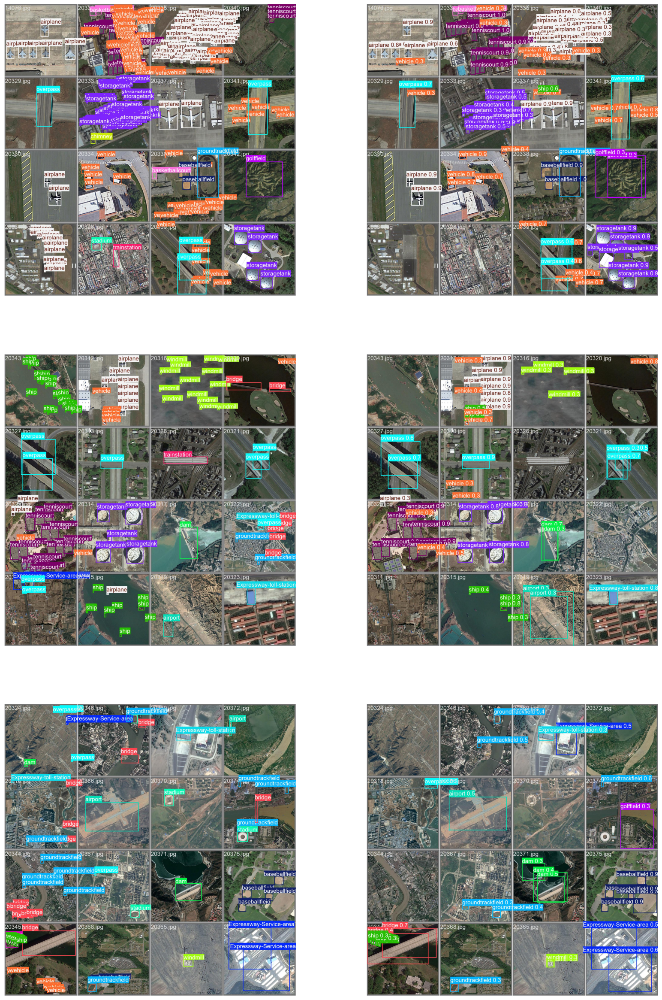

In [37]:
# Testing result[left images are True and Right images are predicted]
val_result_image = ['runs/detect/yolo5/val_batch0_labels.jpg', 'runs/detect/yolo5/val_batch0_pred.jpg', 'runs/detect/yolo5/val_batch1_labels.jpg', 'runs/detect/yolo5/val_batch1_pred.jpg', 'runs/detect/yolo5/val_batch2_labels.jpg', 'runs/detect/yolo5/val_batch2_pred.jpg']
plt.figure(figsize=(20, 30))
for i in range(len(val_result_image)):
    plt.subplot(3, 2, i+1)
    plt.imshow(plt.imread(val_result_image[i]))
    plt.axis(False)

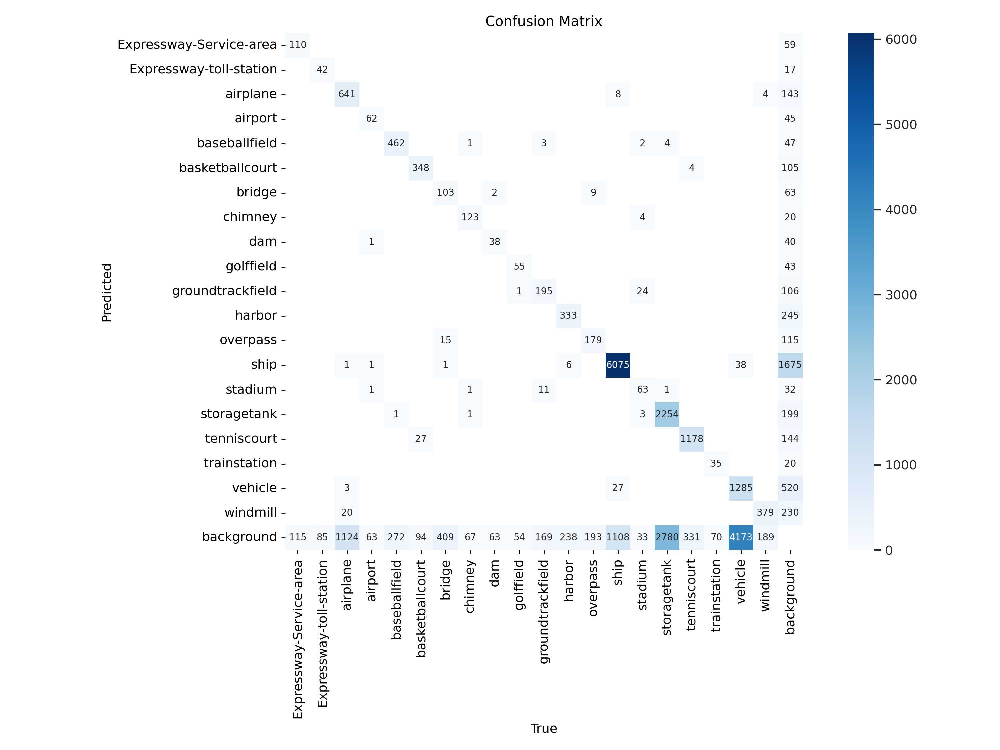

In [38]:
Image(filename='/content/runs/detect/train/confusion_matrix.png', width=800)

In [39]:
import pandas as pd
data = pd.read_csv('/content/runs/detect/train/results.csv')
data

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,506.085,3.40508,5.16058,3.93376,0.54877,0.02463,0.00802,0.00278,3.10275,3.67249,3.11550,0.000139,0.000139,0.000139
1,2,1006.810,2.74138,3.93864,2.87277,0.59761,0.09178,0.07063,0.03177,2.51544,3.01168,2.30562,0.000267,0.000267,0.000267
2,3,1508.640,2.21723,2.96474,2.19550,0.63511,0.12608,0.14451,0.07863,2.08786,2.49367,1.87526,0.000384,0.000384,0.000384
3,4,2001.480,1.95906,2.40713,1.90091,0.45416,0.20855,0.20005,0.11441,1.93761,2.15786,1.70931,0.000367,0.000367,0.000367
4,5,2490.980,1.84256,2.15891,1.77306,0.40560,0.24126,0.22823,0.12983,1.83576,1.99570,1.62272,0.000351,0.000351,0.000351
5,6,2980.660,1.74697,1.93456,1.66480,0.49455,0.28238,0.26735,0.15759,1.72952,1.87389,1.51827,0.000334,0.000334,0.000334
6,7,3472.710,1.67788,1.80834,1.60779,0.43401,0.30454,0.29614,0.17434,1.70898,1.75415,1.48695,0.000318,0.000318,0.000318
7,8,3954.420,1.62677,1.69793,1.55593,0.47585,0.31504,0.31575,0.18762,1.65272,1.73144,1.44383,0.000301,0.000301,0.000301
8,9,4430.480,1.59051,1.61066,1.51399,0.54203,0.35316,0.35238,0.21035,1.59822,1.57376,1.39642,0.000285,0.000285,0.000285
9,10,4898.310,1.55245,1.55463,1.49041,0.51465,0.37007,0.36981,0.22332,1.58011,1.54631,1.37115,0.000268,0.000268,0.000268


In [40]:
import pandas as pd

# Load the CSV file into a DataFrame
file_path = '/content/runs/detect/train/results.csv'
df = pd.read_csv(file_path)

# Extract precision, recall, and accuracy columns
precision = df['metrics/precision(B)']
recall = df['metrics/recall(B)']

# Check the available columns in the DataFrame
print(df.columns)

# If 'metrics/mAP50-95(B)' or a similar column exists, use it for accuracy
# Otherwise, you'll need to modify your training process to output accuracy
# or adjust your code accordingly.

# Example: Assuming 'metrics/mAP50-95(B)' represents accuracy
# Replace 'metrics/mAP50-95(B)' with the actual column name if different.
try:
    accuracy = df['metrics/mAP50-95(B)']
except KeyError:
    print("Accuracy column not found. Check the results.csv file.")
    # Handle the case where accuracy is not available.
    # You might want to skip accuracy calculations or use a different metric.

# Calculate F1 score for each epoch
f1_score = 2 * (precision * recall) / (precision + recall)

# Add F1 score to the DataFrame
df['F1_score'] = f1_score

# Display the precision, recall, F1 score, and accuracy for each epoch
for index, row in df.iterrows():
    print(f"Epoch: {row['epoch']}")
    print(f"Precision: {row['metrics/precision(B)']:.4f}")
    print(f"Recall: {row['metrics/recall(B)']:.4f}")
    print(f"F1 Score: {row['F1_score']:.4f}")

    # Display accuracy only if available
    if 'accuracy' in locals() and accuracy is not None:
        print(f"Accuracy: {row['metrics/mAP50-95(B)']:.4f}")
    else:
        print("Accuracy: Not available")
    print("-" * 30)

Index(['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')
Epoch: 1.0
Precision: 0.5488
Recall: 0.0246
F1 Score: 0.0471
Accuracy: 0.0028
------------------------------
Epoch: 2.0
Precision: 0.5976
Recall: 0.0918
F1 Score: 0.1591
Accuracy: 0.0318
------------------------------
Epoch: 3.0
Precision: 0.6351
Recall: 0.1261
F1 Score: 0.2104
Accuracy: 0.0786
------------------------------
Epoch: 4.0
Precision: 0.4542
Recall: 0.2086
F1 Score: 0.2858
Accuracy: 0.1144
------------------------------
Epoch: 5.0
Precision: 0.4056
Recall: 0.2413
F1 Score: 0.3026
Accuracy: 0.1298
------------------------------
Epoch: 6.0
Precision: 0.4945
Recall: 0.2824
F1 Score: 0.3595
Accuracy: 0.1576
------------------------------
Epoch: 7.0
Precision: 0.4340
Recall: 0.3045
F1 Score: 0.35